# Simulated data: Diffusion-limited aggregation Tree

In [1]:
import numpy as np
import pandas as pd
import networkx as nx
from itertools import chain
import scipy
import sklearn
import pydot
import scanpy as sc
import seaborn as sns
import colorcet as cc
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from datetime import datetime
from matplotlib.backends.backend_pdf import PdfPages

In [2]:
import phlower
phlower.__version__

'0.1.3'

### load data

In [3]:
from scipy.io import loadmat
mat = phlower.dataset.dla10()
mat

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Dec  5 10:39:25 2017',
 '__version__': '1.0',
 '__globals__': [],
 'C': array([[ 1],
        [ 1],
        [ 1],
        ...,
        [10],
        [10],
        [10]], dtype=uint8),
 'M': array([[-5.51678708e+01, -6.93545945e+01, -1.23829867e+02, ...,
          5.06526979e+00, -3.92468910e+00,  8.75258963e+00],
        [-4.40856210e+01, -7.17731891e+01, -1.34532730e+02, ...,
          3.75266766e+00, -1.34520642e+01,  6.89415554e+00],
        [-6.84004644e+01, -7.78769031e+01, -1.40014878e+02, ...,
         -3.97737562e+00, -7.78445379e-02, -4.19547474e+00],
        ...,
        [ 7.92082722e+00,  1.36891323e+01,  5.28606068e+00, ...,
         -9.44735845e+00, -3.21070804e+00,  4.50042513e+00],
        [ 5.66029292e+00,  2.91035078e+00,  1.63806808e+01, ...,
          1.98807131e+00, -3.68240436e+00,  3.86849148e+00],
        [ 1.78814328e+00,  1.84342207e+01,  1.55163538e+01, ...,
         -1.22084883e+01, -2.00

### Assign branches

In [4]:
X = mat['M']
adata = adata = sc.AnnData(X)
adata.obs['C'] = mat['C']
adata.obs['group'] = mat['C']

In [5]:
sc.tl.pca(adata)

In [6]:
adata.obsm['origin'] = adata.X

### check phate dimensionality reduction

In [7]:
import phate
phate_operator = phate.PHATE(n_jobs=-2)
phate_operator.set_params(gamma=0, t=120)
tree_phate_sqrt = phate_operator.fit_transform(adata.X)
adata.obsm['X_origin_phate'] = tree_phate_sqrt


Calculating PHATE...
  Running PHATE on 1440 observations and 60 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.10 seconds.
    Calculating affinities...
    Calculated affinities in 0.01 seconds.
  Calculated graph and diffusion operator in 0.11 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 3.95 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.17 seconds.
Calculated PHATE in 6.24 seconds.


### dimensionality reduction and clustering

In [8]:
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.5)

/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


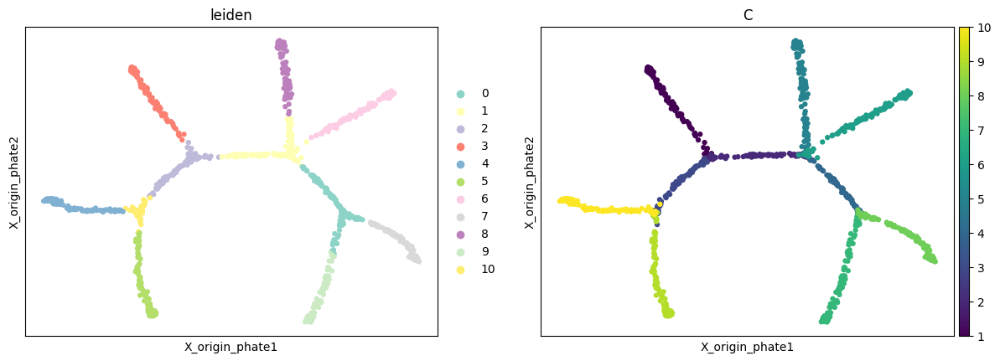

In [9]:
import matplotlib as mpl
sc.pl.embedding(adata, color=['leiden', "C"], basis='X_origin_phate', palette="Set3")

In [10]:
adata.obs['group'] = adata.obs.leiden

### ddhodge

In [11]:
phlower.ext.ddhodge(adata, basis='X_pca', roots=(adata.obs.group=="3"), k=30, npc=10,ndc=20,s=2, verbose=True)

2024-10-02 14:58:36.520549 distance_matrix
2024-10-02 14:58:36.580053 Diffusionmaps: 
done.
2024-10-02 14:58:38.071265 diffusion distance:
2024-10-02 14:58:38.424134 transition matrix:
2024-10-02 14:58:39.054487 graph from A
2024-10-02 14:58:39.057160 Rewiring: 
2024-10-02 14:58:39.057204 div(g_o)...
2024-10-02 14:58:41.144854 edge weight...
2024-10-02 14:58:41.993593 cholesky solve ax=b...
+ 1e-06 I is positive-definite
2024-10-02 14:58:43.511080 grad...
2024-10-02 14:58:45.019544 potential.
2024-10-02 14:58:46.072610 ddhodge done.
done.
2024-10-02 14:58:46.333967 calculate layouts
2024-10-02 15:00:29.654271 done


### show layouts and pseudo time

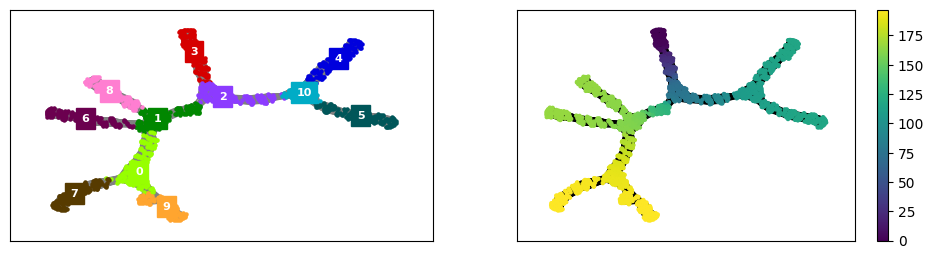

In [12]:
_, ax = plt.subplots(1,2, figsize=(12, 3))
phlower.pl.nxdraw_group(adata,  node_size=5, show_edges=True, show_legend=False, label=True, labelstyle='box', labelsize=8, markerscale=5, ax=ax[0])
phlower.pl.nxdraw_score(adata,  node_size=5, ax=ax[1])

### create holes

In [13]:
phlower.tl.construct_delaunay(adata, trunc_quantile = 0.8, start_n=10, end_n=10, circle_quant=0.7, calc_layout=False)

start clusters  ['1', '8', '5', '2', '3', '10', '4', '0', '6']
end clusters  ['9', '7', '1', '8', '5', '0', '4', '6']


### show holes in the original space

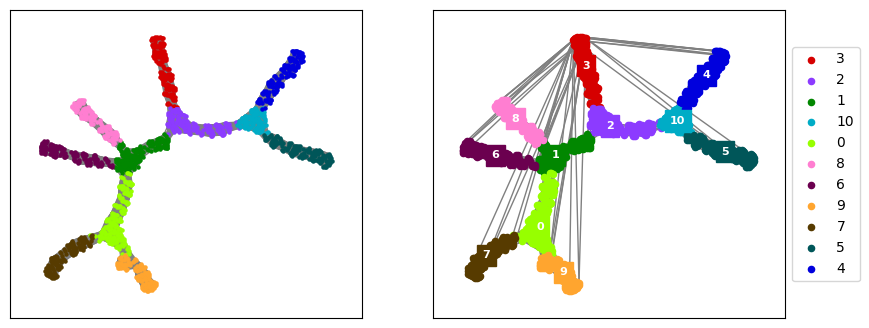

In [14]:
fig, ax = plt.subplots(1,2, figsize=(10,4))
phlower.pl.nxdraw_group(adata, node_size=5, show_edges=True, ax=ax[0], show_legend=False, label=False, labelstyle='box', labelsize=8)
phlower.pl.nxdraw_group(adata, graph_name="X_pca_ddhodge_g_triangulation_circle", node_size=20, show_edges=True, ax=ax[1], show_legend=True, labelstyle='box', labelsize=8)


### Hodge laplacian decomposition

In [15]:
phlower.tl.L1Norm_decomp(adata)

0.7822353839874268  sec


### check the number of harmonic (eigenvalue eqaul zero)

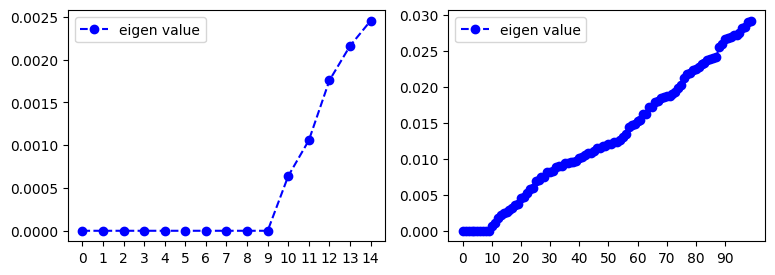

In [16]:
_, ax = plt.subplots(1,2, figsize=(9,3))
phlower.pl.plot_eigen_line(adata, n_eig=15,ax=ax[0])
phlower.pl.plot_eigen_line(adata, n_eig=100, step_size=10, ax=ax[1])

### select the best number of eigen vecoters to use

In [17]:
phlower.tl.knee_eigen(adata)

knee eigen value is  10


### trajectory paths sampling using preference random walk

In [18]:
phlower.tl.random_climb_knn(adata, n=10000, knn_edges_k=40)

100%|██████████| 10000/10000 [00:08<00:00, 1149.01it/s]


### project trajectory paths to harmonic space

In [19]:
phlower.tl.trajs_matrix(adata)

2024-10-02 15:01:12.061823 projecting trajectories to simplics...
2024-10-02 15:01:23.540936 Embedding trajectory harmonics...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use: 10


/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


2024-10-02 15:01:54.596506 done.


### plot one trajectory to show how it looks like

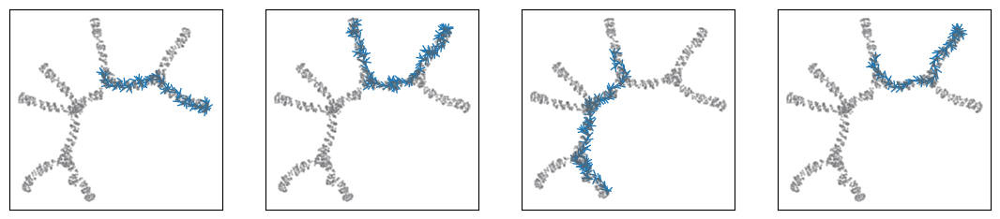

In [20]:
from scipy import constants
fig_width = 9
fig, axs = plt.subplots(1, 4,figsize=(fig_width*1.5, fig_width*0.5 / constants.golden))
phlower.pl.plot_traj(adata, graph_name= "X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][0], colorid=0, node_size=1, ax=axs[0])
phlower.pl.plot_traj(adata, graph_name= "X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][1], colorid=0, node_size=1, ax=axs[1])
phlower.pl.plot_traj(adata, graph_name= "X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][2], colorid=0, node_size=1, ax=axs[2])
phlower.pl.plot_traj(adata, graph_name= "X_pca_ddhodge_g_triangulation_circle", trajectory=adata.uns['knn_trajs'][3], colorid=0, node_size=1, ax=axs[3])

### clustering in harmonic space (t-map space)

In [21]:
from collections import Counter
phlower.tl.trajs_clustering(adata, eps=0.5)
Counter(adata.uns['trajs_clusters'])

Counter({0: 3144, 1: 2719, 2: 1614, 3: 999, 4: 906, 5: 618})

### clusters in UMAP and in trajectories in ct-map space

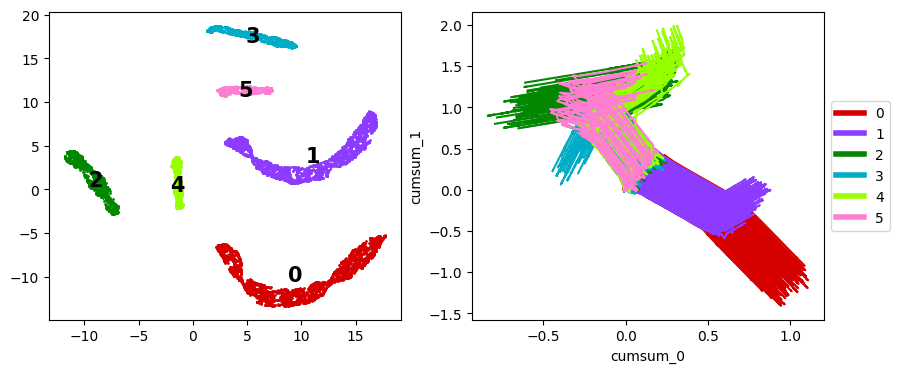

In [22]:
_, ax = plt.subplots(1,2, figsize=(10, 4))
phlower.pl.plot_trajs_embedding(adata, clusters="trajs_clusters", ax=ax[0], show_legend=False)
phlower.pl.plot_trajectory_harmonic_lines(adata, sample_ratio=0.05, show_legend=True, ax = ax[1]) 

### density for trajectory paths clusters

z_min, z_max 6.456781240499767e-08 4.784515718327029e-06


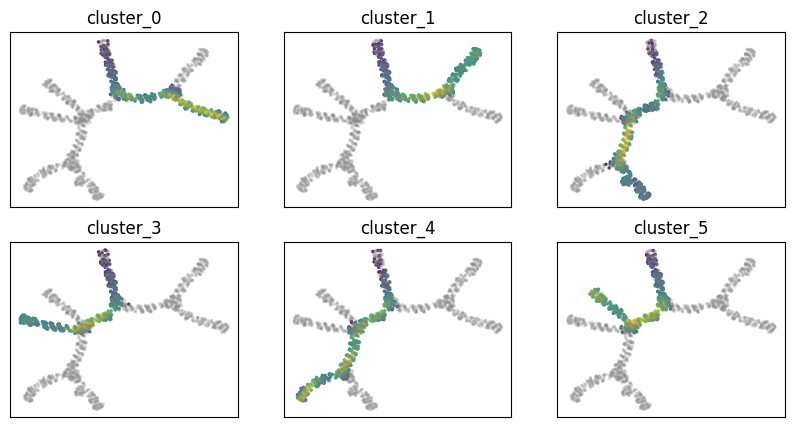

In [23]:
phlower.pl.plot_density_grid(adata,  figsize=(10, 5), cluster_name='trajs_clusters', sample_n=1000, bg_alpha=0.2)

### annotate harmonic clustering results.

In [24]:
anno_dic = {
    0: "C0",
    1: "C1",
    2: "C2",
    3: "C3",
    4: "C4",
    5: "C5",
}
adata.uns['annotation']= [anno_dic.get(i, i) for i in adata.uns['trajs_clusters']]

### create trajectory tree and use STREAM to do the visualization

In [25]:
phlower.tl.harmonic_stream_tree(adata, 
                                trajs_clusters='annotation', 
                                min_bin_number=50,
                                min_kde_quant_rm=0.01,
                                verbose=True)

2024-10-02 15:02:06.926930 trajectory groups ranking...
eigen_n < 1, use knee_eigen to find the number of eigen vectors to use
eigen_n: 10
{'C0', 'C1', 'C2', 'C4', 'C3', 'C5'}


traj bins: 100%|██████████| 6/6 [00:20<00:00,  3.43s/it]


2024-10-02 15:02:29.013501 sync bins to by pseudo time...
2024-10-02 15:02:30.756389 calculating distances between bin pairs...
2024-10-02 15:02:31.959324 fate tree creating...
[('C3', 'C2', 'C4', 'C5'), ('C0', 'C1')]
2024-10-02 15:02:31.960955 tree attributes adding...


/home/sz753404/miniconda3/envs/R422/lib/python3.10/site-packages/phlower/tools/harmonic_pseudo_tree.py:697: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  roots = np.array(htree_roots)


2024-10-02 15:02:32.590615 plugin to STREAM...
2024-10-02 15:02:32.593117 projecting trajs to harmonic...
2024-10-02 15:02:33.651980 cumsum...
2024-10-02 15:02:34.013619 edge cumsum dict...


edges projection: 100%|██████████| 10000/10000 [00:08<00:00, 1212.29it/s]


2024-10-02 15:02:43.164977 done...
2024-10-02 15:02:47.910518 done...


### Stream plot show the trajectory tree

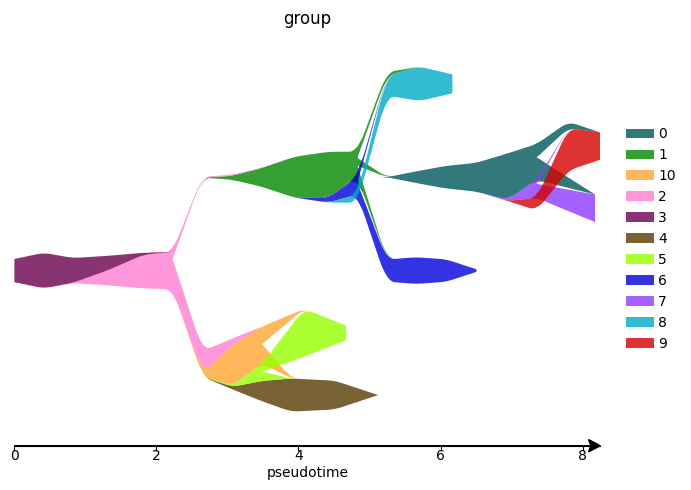

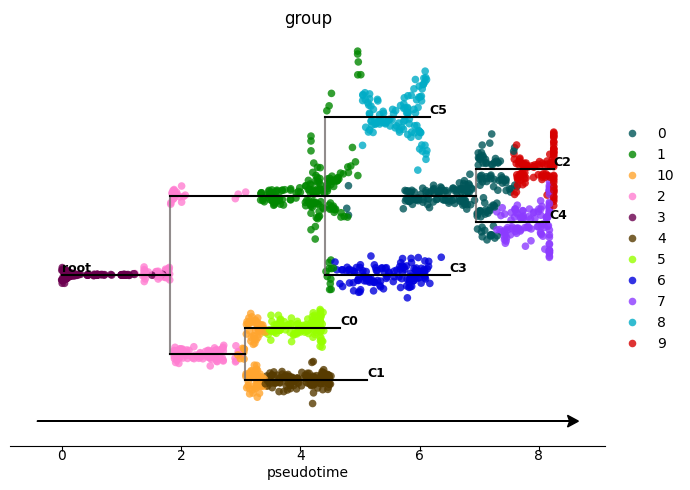

In [26]:
adata.uns['workdir'] = ''
phlower.ext.plot_stream(adata, fig_size=(7,5), dist_scale=1.2,factor_min_win=1.2)
phlower.ext.plot_stream_sc(adata, fig_size=(7,5))

### trajectory clusters in t-map space

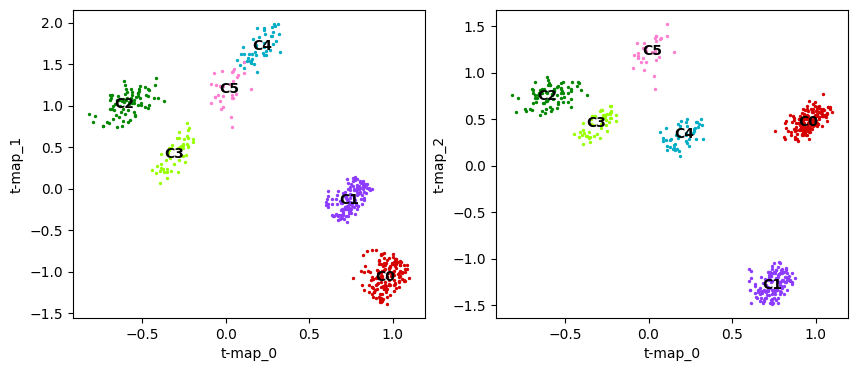

In [27]:
_, ax = plt.subplots(1,2, figsize=(10, 4))
phlower.pl.plot_trajectory_harmonic_points(adata, sample_ratio=0.05, show_legend=False, clusters='annotation', retain_clusters= list(set(anno_dic.values())), ax=ax[0]) 
phlower.pl.plot_trajectory_harmonic_points(adata, sample_ratio=0.05, show_legend=False, clusters='annotation', retain_clusters= list(set(anno_dic.values())), ax=ax[1], dims=[0,2]) 

### trajector clusters in ct-map space

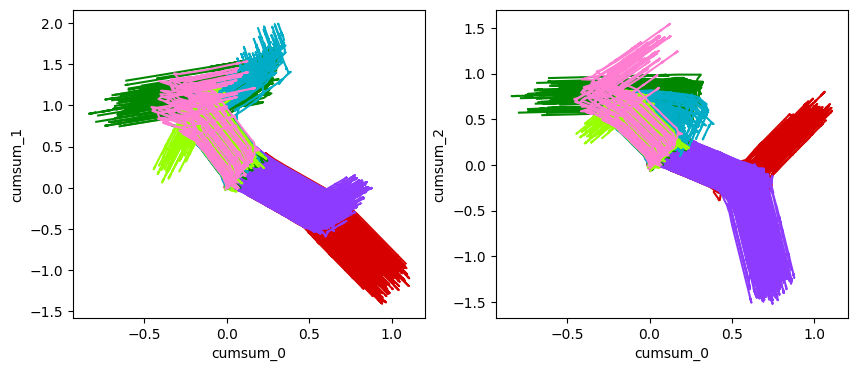

In [28]:
_, ax = plt.subplots(1,2, figsize=(10, 4))
phlower.pl.plot_trajectory_harmonic_lines(adata, sample_ratio=0.05, show_legend=False, clusters='annotation', retain_clusters= list(set(anno_dic.values())), ax = ax[0]) 
phlower.pl.plot_trajectory_harmonic_lines(adata, sample_ratio=0.05, show_legend=False, clusters='annotation', retain_clusters= list(set(anno_dic.values())), ax = ax[1], dims=[0,2]) 


### trajectory clusters in t-map space (3D)

In [29]:
phlower.pl.plot_trajectory_harmonic_points_3d(adata,sample_ratio=0.05, dims=(0,1,2), clusters='annotation', figsize=(800, 800)) 

3


### trajector clusters in ct-map space with backbone (3D)

In [30]:
phlower.pl.harmonic_backbone_3d(adata, sample_ratio=0.05, dims=(0,1,2), clusters='annotation',  figsize=(800, 800)) 

In [31]:
import pickle
import os
from datetime import date

if not os.path.exists("save"):
    os.mkdir('save')

today_ = date.today().strftime("%Y-%m-%d")
pickle.dump(adata, open(f"save/dla10_{today_}.pickle", 'wb'))

In [32]:
import session_info
session_info.show()